# Required libraries

In [ ]:
!pip install numpy torch pillow torchvision opencv-python scikit-image matplotlib tqdm datasets diffusers transformers accelerate xformers kornia

INFO: pip is looking at multiple versions of xformers to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 73.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 32.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB

In [ ]:
import numpy as np
import torch
from PIL import Image
import kornia.color as kcolor
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder
import random
import os
import cv2
import skimage.color as color
from skimage.color import lab2rgb
from matplotlib import pyplot as plt
from tqdm.auto import tqdm
from datasets import load_dataset
from diffusers import (
    StableDiffusionPipeline,
    StableDiffusionImg2ImgPipeline,
    StableDiffusionControlNetImg2ImgPipeline,
    StableDiffusionControlNetPipeline,
    DPMSolverMultistepScheduler,
    UniPCMultistepScheduler,
    DDIMScheduler,
    DDPMPipeline
)
from diffusers.models import UNet2DConditionModel
from diffusers import ControlNetModel
from transformers import BlipProcessor, BlipForConditionalGeneration
import albumentations as A
from albumentations.pytorch import ToTensorV2
import random

In [ ]:
device = 'mps' if torch.backends.mps.is_available() else 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')

Using device: cuda


In [ ]:
!nvidia-smi

Tue Feb 11 09:56:09 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off |   00000000:00:04.0 Off |                    0 |
| N/A   34C    P0             48W /  400W |       5MiB /  40960MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

# Imagenette dataset

Alternative dataset based on ImageNet with reduced resolution and/or the number of samples and labels.
Original ImageNet dataset is ~160GB.

In [ ]:
dataset = torchvision.datasets.Imagenette(root="imagenette/", split='val', size='full', download=True)

100%|██████████| 1.56G/1.56G [00:29<00:00, 52.0MB/s]


Extracting imagenette/imagenette2.tgz to imagenette/


In [ ]:
dataset.classes

[('tench', 'Tinca tinca'),
 ('English springer', 'English springer spaniel'),
 ('cassette player',),
 ('chain saw', 'chainsaw'),
 ('church', 'church building'),
 ('French horn', 'horn'),
 ('garbage truck', 'dustcart'),
 ('gas pump', 'gasoline pump', 'petrol pump', 'island dispenser'),
 ('golf ball',),
 ('parachute', 'chute')]

# Building the dataset for our task

## Helper functions for Dataset creation

In [ ]:
def is_black_and_white(img):
    #Check if an image is grayscale by comparing RGB channels.
    img_array = np.array(img)
    if len(img_array.shape) < 3 or img_array.shape[2] != 3:
        return True  # Already grayscale
    return np.all(img_array[:, :, 0] == img_array[:, :, 1]) and np.all(img_array[:, :, 1] == img_array[:, :, 2])

In [ ]:
def mean_saturation(img):
    #Calculate the mean saturation of an image in HSV color space.
    img_hsv = img.convert('HSV')
    np_hsv = np.array(img_hsv)
    return np.mean(np_hsv[:, :, 1]) / 255.0  # Normalize to [0, 1]

## RGB dataset composition and captioning

In [ ]:
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large").to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

In [ ]:
class PreprocessedImagenette(Dataset):
    def __init__(self, root, image_size):
        self.dataset = torchvision.datasets.ImageFolder(root=root)
        self.augment = A.Compose([
            A.OneOf([
                A.MotionBlur(blur_limit=5),
                A.GaussianBlur(blur_limit=(3, 7)),
                A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.05)
            ], p=0.1),  # 10% probability

            A.RandomBrightnessContrast(brightness_limit=0.1, contrast_limit=0.2, p=0.1),  # 10% probability

            A.HueSaturationValue(hue_shift_limit=0, sat_shift_limit=20, val_shift_limit=0, p=0.1),  # 10% chroma boost

            ToTensorV2()
        ])
        self.transform = transforms.Compose([
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
        ])
        self.filtered_data = []
        self.caption_model = model
        self.caption_processor = processor

        for img_path, _ in self.dataset.samples:
            img = Image.open(img_path).convert('RGB')
            if is_black_and_white(img) or mean_saturation(img) < 0.1:
                continue
            self.filtered_data.append(img_path)  # Store label as string

    def __len__(self):
        return len(self.filtered_data)

    def __getitem__(self, idx):
        img_path = self.filtered_data[idx]
        img = Image.open(img_path).convert('RGB')

        img_np = np.array(img)
        img_tensor = self.augment(image=img_np)["image"]
        img_np = img_tensor.permute(1, 2, 0).cpu().numpy()
        img_np = (img_np * 255).clip(0, 255).astype(np.uint8)
        img_pil = Image.fromarray(img_np)

        rgb_img = self.transform(img)

        gray = kcolor.RgbToGrayscale()
        grayscale_img = gray(rgb_img)

        # Get caption using the interrogator
        inputs = self.caption_processor(img,
                                        return_tensors="pt").to(device)
        caption = self.caption_model.generate(**inputs,
                                              max_length=50,
                                              min_length=10,
                                              num_beams=5,               # Use beam search for better accuracy (higher values reduce creativity)
                                              temperature=0.5,           # Lower temperature makes the model less creative (more deterministic)
                                              top_p=0.9,                 # Nucleus sampling for diversity, but keep it lower to avoid weird outputs
                                              repetition_penalty=1.5,    # Penalize repeated phrases (helps reduce repetition errors)
                                              no_repeat_ngram_size=3,
                                              do_sample=True)     # Prevent repeating n-grams, which can avoid odd words like "arafed")
        decoded_caption = self.caption_processor.tokenizer.decode(caption[0], skip_special_tokens=True)

        return rgb_img, grayscale_img, decoded_caption # Label as class name

In [ ]:
custom_dataset = PreprocessedImagenette(root="imagenette/", image_size=224) # ~2min and 30 sec

In [ ]:
sample_rgb, sample_gray, sample_caption = custom_dataset[45]

In [ ]:
print(f"Caption: {sample_caption}")

Caption: there is a man kneeling down holding a fish in front of a body of water


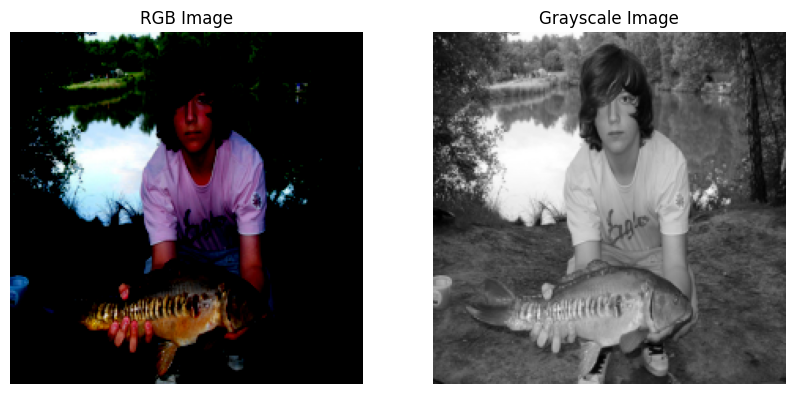

In [ ]:
rgb_image_np = sample_rgb.permute(1, 2, 0).numpy()
gray_image_np = sample_gray.squeeze(0).numpy()

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(rgb_image_np)
ax[0].set_title("RGB Image")
ax[0].axis("off")

ax[1].imshow(gray_image_np, cmap="gray")
ax[1].set_title("Grayscale Image")
ax[1].axis("off")
plt.show()

In [ ]:
batch_size = 12

In [ ]:
train_loader = DataLoader(custom_dataset,
                          batch_size=batch_size,
                          shuffle=True,
                          drop_last=True)
# val_loader = DataLoader(val_dataset,
#                         batch_size=batch_size,
#                         shuffle=True,
#                         drop_last=True)

In [ ]:
for batch in train_loader:
    rgb_image, gray_image, caption = batch
    print(f"Caption: {caption}")
    print(f"Gray image shape: {gray_image.shape}")
    print(f"RGB image shape: {rgb_image.shape}")
    break

Caption: ('there is a woman that is holding a chainsaw in front of a building', 'this is a dog eating spaghetti out of a bowl on the floor', 'smiling man holding a large fish in front of a body of water', 'this is a close up of a white golf ball on a blue surface', 'there is a statue of an angel holding a sword in front of a building', 'doorway to a white church with a blue dome and a cross on the top of it', 'this is an image of a garbage truck parked on the side of the road', 'someone is parasailing in the blue sky with a red parachute', 'vehicles are parked on the side of the road in front of a building', 'there is a man that is flying through the air with a parachute', 'there is a man that is standing on a tarp with a parachute', 'gas pump on the side of the road with a sign for kerosene underneath it')
Gray image shape: torch.Size([12, 1, 224, 224])
RGB image shape: torch.Size([12, 3, 224, 224])


# Defining the model

Model card: https://huggingface.co/stabilityai/stable-diffusion-2-1\

It is a fine-tuned model from https://huggingface.co/stabilityai/stable-diffusion-2.

In [ ]:
model_id = "stabilityai/stable-diffusion-2-1"

In [ ]:
pipe = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, torch_dtype=torch.float32)

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/345 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/824 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/633 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/939 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/611 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

### LoRA of UNet

In Stable Diffusion UNet, LoRA is typically applied to attention layers and their projections.
- attn1 (Self-attention): Responsible for capturing local dependencies within the image
- attn2 (Cross-attention): Responsible for conditioning on the text/image embeddings
- proj_in/proj_out : Projection layers
- ff.net: Feedforward layers in Transformer blocks

In [ ]:
def print_trainable_parameters(model):
    trainable_params = 0
    all_param = 0
    for _, param in model.named_parameters():
        all_param += param.numel()
        if param.requires_grad:
            trainable_params += param.numel()
    print(
        f"trainable params: {trainable_params} || all params: {all_param} || trainable%: {100 * trainable_params / all_param}"
    )

In [ ]:
from peft import LoraConfig, get_peft_model
import copy

# Configure LoRA with verified target modules
lora_config = LoraConfig(
    r=16,  # Rank
    lora_alpha=8,
    target_modules=["to_k", "to_q", "to_v", "to_out.0", "ff.net.0.proj", "ff.net.2"],  # This is a broader selection, maybe high VRAM usage but covers everything
    lora_dropout=0.05,
    bias="none",
    modules_to_save=None
)

In [ ]:
# Create a copy of the UNet before applying LoRA
unet_lora = copy.deepcopy(pipe.unet)

# Apply LoRA
unet_lora = get_peft_model(unet_lora, lora_config)

# Freeze the original parameters of the model
for param in unet_lora.parameters():
    param.requires_grad = False

# Unfreeze LoRA parameters
for name, param in unet_lora.named_parameters():
    if "lora" in name:
        param.requires_grad = True

# Verify trainable parameters
print_trainable_parameters(unet_lora)

trainable params: 6115328 || all params: 872026052 || trainable%: 0.7012781310804233


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

# Count parameters for each model component in the pipeline
total_params = 0
for name, component in pipe.components.items():
    if hasattr(component, "parameters"):
        num_params = count_parameters(component)
        print(f"{name}: {num_params:,} parameters")
        total_params += num_params

print(f"Total parameters in pipeline: {total_params:,}")

vae: 83,653,863 parameters
text_encoder: 340,387,840 parameters
unet: 865,910,724 parameters
Total parameters in pipeline: 1,289,952,427


In [ ]:
pipe.vae.requires_grad_(False);
pipe.text_encoder.requires_grad_(False);
pipe.unet.requires_grad_(False);

## LoRA Training Loop

In [ ]:
num_epochs = 1
#optimizer = torch.optim.Adam(pipe.controlnet.parameters(),lr=1e-5)
optimizer = torch.optim.AdamW(unet_lora.parameters(), lr=1e-5,fused=True)
unet_lora = unet_lora.to(device)

Here we sampled one random t per image

Epoch 1 Progress:   0%|          | 0/1022 [00:00<?, ?it/s]

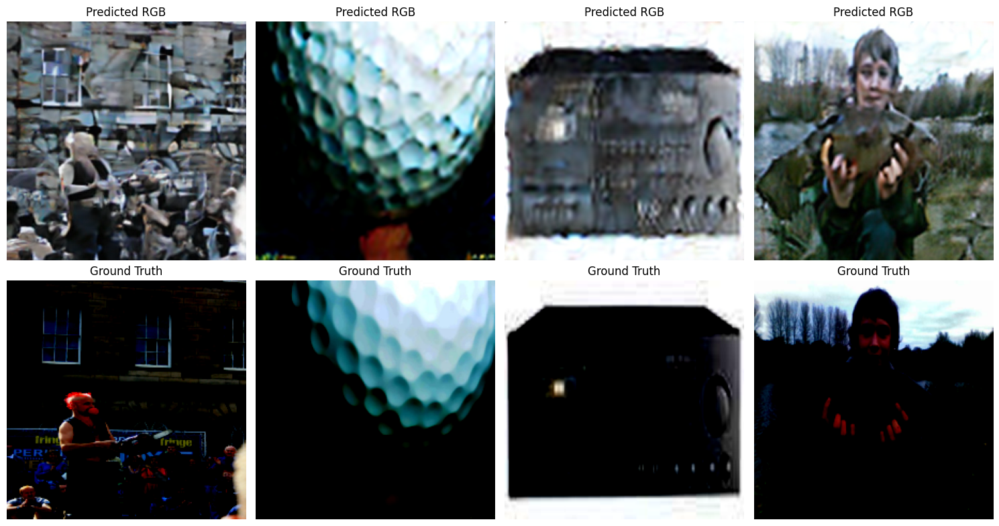

  Batch 0/1022 - Loss: 0.101855
  Batch 50/1022 - Loss: 0.142415
  Batch 100/1022 - Loss: 0.156962
  Batch 150/1022 - Loss: 0.137681


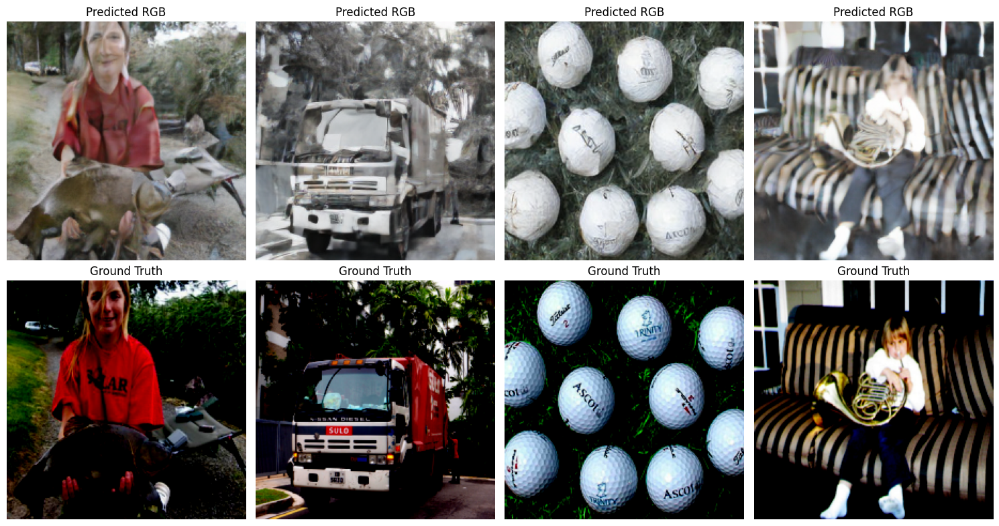

  Batch 200/1022 - Loss: 0.120294
  Batch 250/1022 - Loss: 0.112282
  Batch 300/1022 - Loss: 0.077867
  Batch 350/1022 - Loss: 0.034505


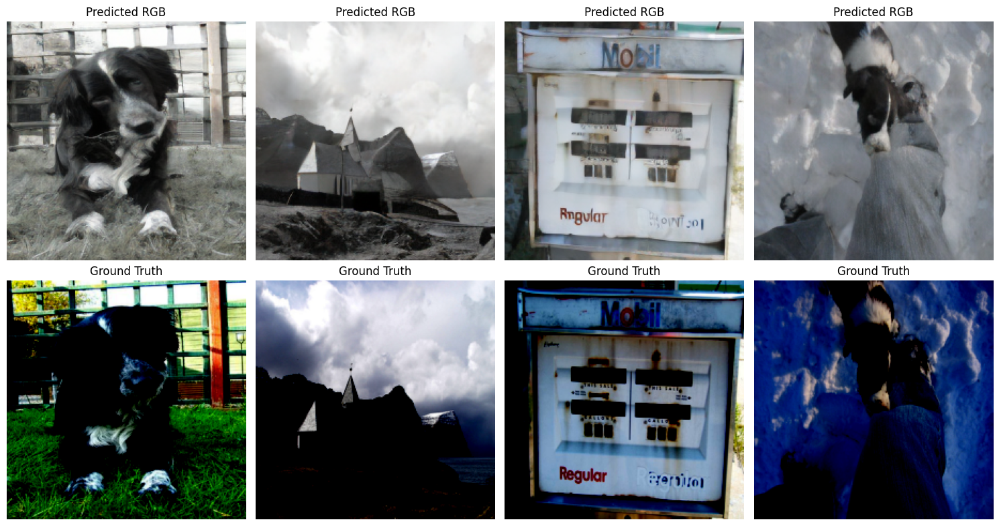

  Batch 400/1022 - Loss: 0.079589
  Batch 450/1022 - Loss: 0.057438
  Batch 500/1022 - Loss: 0.103400
  Batch 550/1022 - Loss: 0.061968


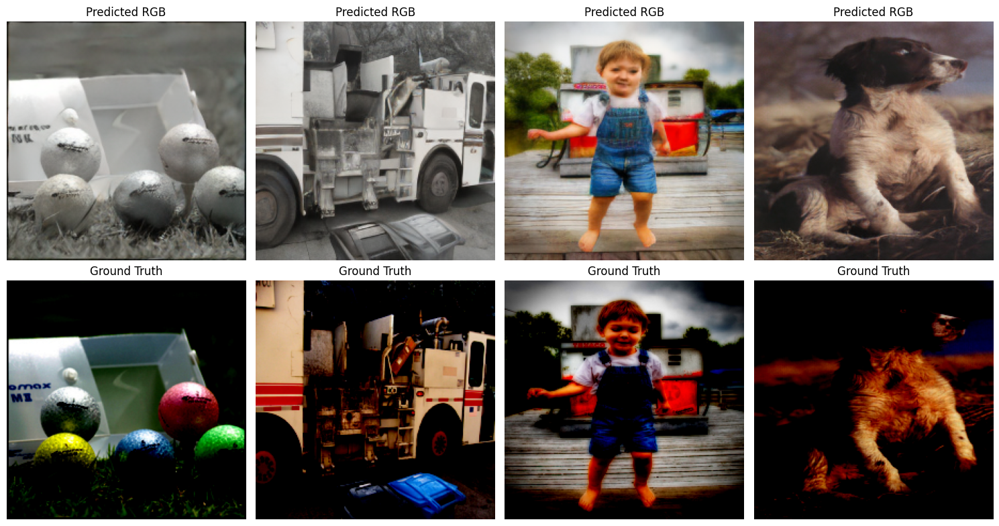

  Batch 600/1022 - Loss: 0.063916
  Batch 650/1022 - Loss: 0.058423
  Batch 700/1022 - Loss: 0.068773
  Batch 750/1022 - Loss: 0.044895


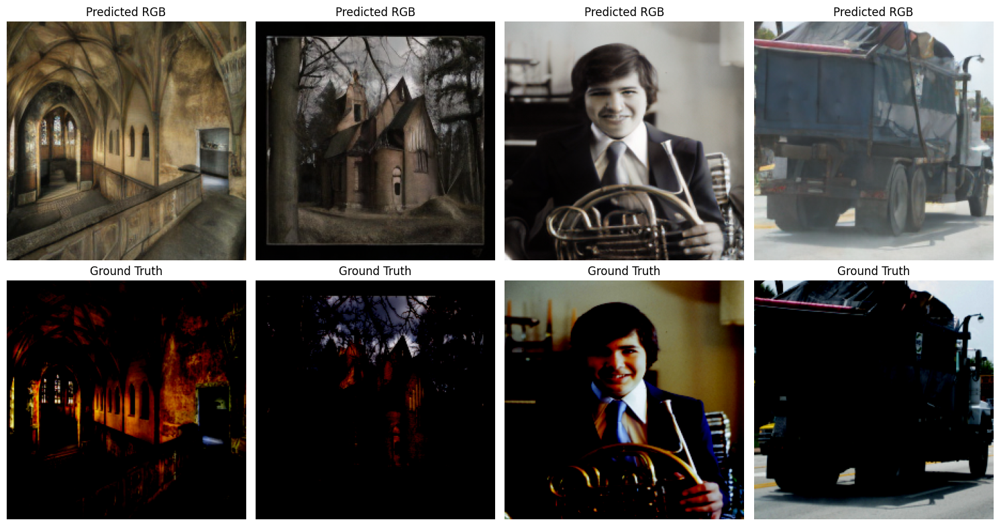

  Batch 800/1022 - Loss: 0.056255
  Batch 850/1022 - Loss: 0.055489
  Batch 900/1022 - Loss: 0.085211
  Batch 950/1022 - Loss: 0.040276


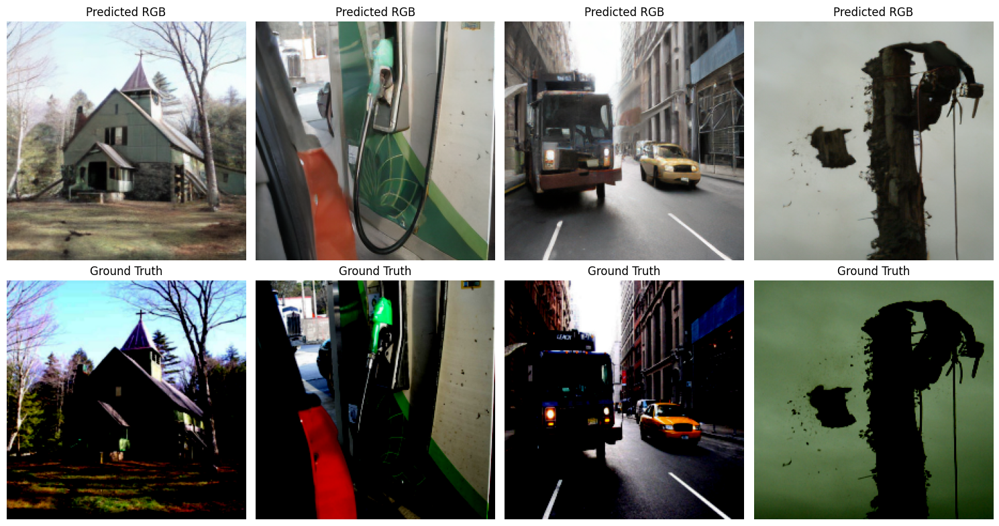

  Batch 1000/1022 - Loss: 0.067492
Epoch 1 - Avg Loss: 0.075231


In [ ]:
for epoch in range(num_epochs):
    epoch_loss = 0
    for batch_idx, batch in enumerate(tqdm(train_loader, desc=f"Epoch {epoch+1} Progress")):
        rgb_input, gray_input, caption = batch
        rgb_input, gray_input = rgb_input.to(device), gray_input.to(device)

        gray_input = gray_input.repeat(1, 3, 1, 1)

        # Encode both RGB and grayscale into latent space
        z_rgb = pipe.vae.encode(rgb_input).latent_dist.sample() * pipe.vae.config.scaling_factor
        z_gray = pipe.vae.encode(gray_input).latent_dist.sample() * pipe.vae.config.scaling_factor

        # Sample timestep
        t_orig = torch.rand((batch_size,), device=device)  # for UNet
        t = t_orig.view(-1, 1, 1, 1)  # reshaped for interpolation

        # Apply interpolation
        z_t = (1 - t) * z_gray + t * z_rgb

        # Caption encoding
        text_embeddings = pipe.text_encoder(
            pipe.tokenizer(
                caption,
                return_tensors="pt",
                padding="max_length",
                max_length=pipe.tokenizer.model_max_length
            ).input_ids.to(device)
        )[0].to(dtype=torch.float32)

        # Predict residual color latents using LoRA-augmented UNet
        pred_residual = unet_lora(
            z_t.to(dtype=torch.float32),
            t_orig.to(dtype=torch.float32),
            encoder_hidden_states=text_embeddings.to(dtype=torch.float32),
            return_dict=False
        )[0]

        # Fix: Train the model to predict `z_rgb`, not just the residual
        loss = F.mse_loss(z_rgb, (z_t + pred_residual))

        epoch_loss += loss.item()

        optimizer.zero_grad()
        loss.backward()
        #torch.nn.utils.clip_grad_norm_(unet_lora.parameters(), 1.0)
        optimizer.step()

        if batch_idx % 200 == 0:
            num_samples_to_show = min(4, pred_residual.shape[0])

            with torch.no_grad():
                # Restore latent color information
                pred_colored_latents = z_t + pred_residual

                # Decode to image space
                pred_rgb_images = pipe.vae.decode(
                    (pred_colored_latents / pipe.vae.config.scaling_factor).to(dtype=torch.float32)
                ).sample

                # Scale to [0,1] range
                pred_rgb_images = (pred_rgb_images / 2 + 0.5).clamp(0, 1)
                pred_rgb_images = pred_rgb_images.cpu().permute(0, 2, 3, 1).numpy()

                # Create visualization
                fig, axes = plt.subplots(2, num_samples_to_show, figsize=(15, 8))

                for i in range(num_samples_to_show):
                    axes[0, i].imshow(pred_rgb_images[i])
                    axes[0, i].set_title("Predicted RGB")
                    axes[0, i].axis("off")

                    axes[1, i].imshow(rgb_input.to('cpu', dtype=float).permute(0, 2, 3, 1)[i])
                    axes[1, i].set_title("Ground Truth")
                    axes[1, i].axis("off")

                plt.tight_layout()
                plt.show()

        if batch_idx % 50 == 0:
            print(f"  Batch {batch_idx}/{len(train_loader)} - Loss: {loss.item():.6f}")

    epoch_loss /= len(train_loader)
    print(f"Epoch {epoch+1} - Avg Loss: {epoch_loss:.6f}")


## Saving the model

In [ ]:
lora_weights = {name: param for name, param in unet_lora.named_parameters() if "lora" in name}
torch.save(lora_weights, "lora_weights.pth")

## Loading the parameters

Missing the part where i take the model trained and load the lora weights.

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline

In [ ]:
pipeline = StableDiffusionImg2ImgPipeline.from_pretrained(model_id, torch_dtype=torch.float32)
pipeline = pipe.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

# Count parameters for each model component in the pipeline
total_params = 0
for name, component in pipeline.components.items():
    if hasattr(component, "parameters"):
        num_params = count_parameters(component)
        print(f"{name}: {num_params:,} parameters")
        total_params += num_params

print(f"Total parameters in pipeline: {total_params:,}")

vae: 83,653,863 parameters
text_encoder: 340,387,840 parameters
unet: 865,910,724 parameters
Total parameters in pipeline: 1,289,952,427


In [ ]:
pipeline.unet = unet_lora

In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

# Count parameters for each model component in the pipeline
total_params = 0
for name, component in pipeline.components.items():
    if hasattr(component, "parameters"):
        num_params = count_parameters(component)
        print(f"{name}: {num_params:,} parameters")
        total_params += num_params

print(f"Total parameters in pipeline: {total_params:,}")

vae: 83,653,863 parameters
text_encoder: 340,387,840 parameters
unet: 872,026,052 parameters
Total parameters in pipeline: 1,296,067,755


# Pseudo-infernce

In [ ]:
val_batch = next(iter(val_loader))

rgb_image, gray_image, caption, label = val_batch

negative_prompt = "grainy black-and-white photo, photo taken on an old box camera, grayscale photography"
prompt = ""

In [ ]:
images = pipeline(prompt=prompt, negative_prompt=negative_prompt, image=gray_image, strength=0).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

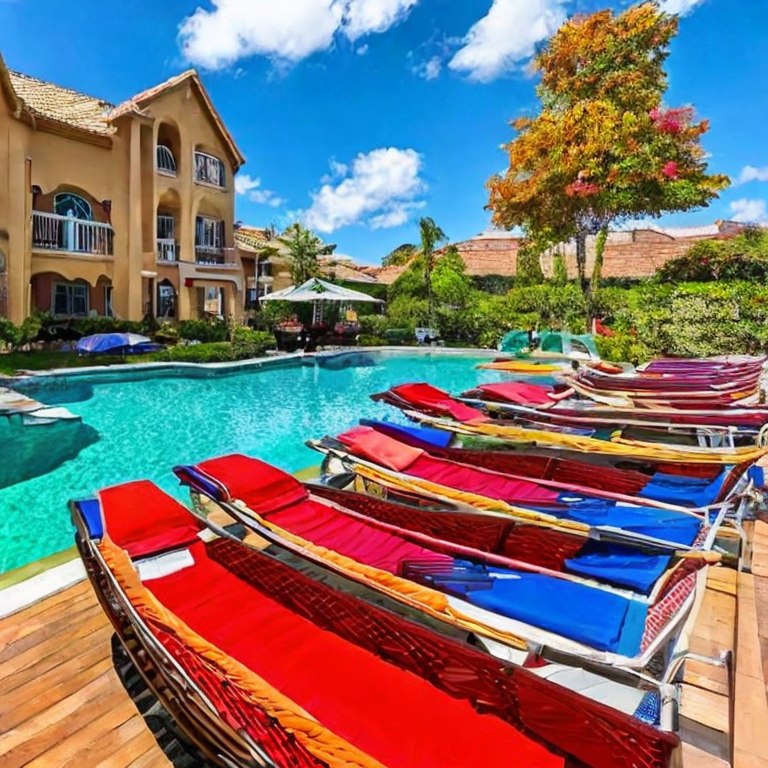

In [ ]:
images

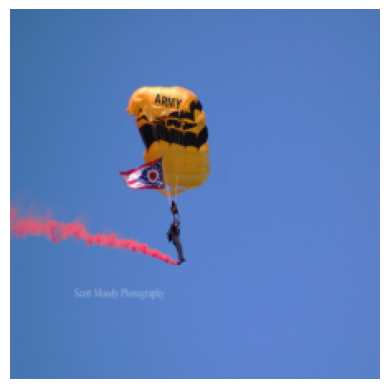

In [ ]:
rgb_image_np = rgb_image[0].permute(1, 2, 0).cpu().numpy()  # Take first image in batch

# Rescale from [-1, 1] to [0, 1] if necessary
rgb_image_np = (rgb_image_np * 0.5) + 0.5  # Assuming normalization with mean=0.5, std=0.5
rgb_image_np = rgb_image_np.clip(0, 1)

# Display the image
plt.imshow(rgb_image_np)
plt.axis("off")
plt.show()

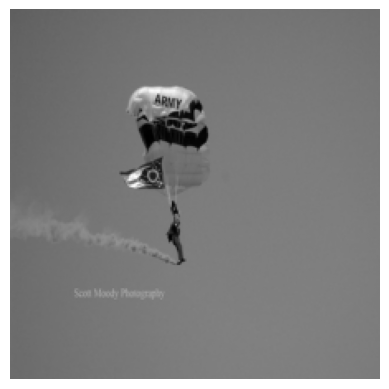

In [ ]:
gray_image_np = gray_image[0].permute(1, 2, 0).cpu().numpy()  # Take first image in batch

# Rescale from [-1, 1] to [0, 1] if necessary
gray_image_np = (gray_image_np * 0.5) + 0.5  # Assuming normalization with mean=0.5, std=0.5
gray_image_np = gray_image_np.clip(0, 1)

# Display the image
plt.imshow(gray_image_np, cmap="gray")
plt.axis("off")
plt.show()